### Libraries

In [1]:
import pandas as pd
import numpy as np
import os
import glob
import nibabel as nb
import scipy.stats
from brainspace.mesh.mesh_io import read_surface
from brainspace.plotting import plot_hemispheres
from brainspace.gradient import GradientMaps
from brainspace.mesh.array_operations import smooth_array
import seaborn as sns
import re

### Load surfaces and masks

In [2]:
# Path to MICAPIPEsurf = mask_5k !
micapipe=os.popen("echo $MICAPIPE").read()[:-1]

# Load native mid surface
inf_lh = read_surface(micapipe + '/surfaces/fsLR-5k.L.inflated.surf.gii', itype='gii')
inf_rh = read_surface(micapipe + '/surfaces/fsLR-5k.R.inflated.surf.gii', itype='gii')

mask_lh =  nb.load(micapipe + '/surfaces/fsLR-5k.R.mask.shape.gii').darrays[0].data
mask_rh =  nb.load(micapipe + '/surfaces/fsLR-5k.L.mask.shape.gii').darrays[0].data
mask_5k = np.concatenate((mask_lh, mask_rh), axis=0)

### Create a brain mask derived from the thickness

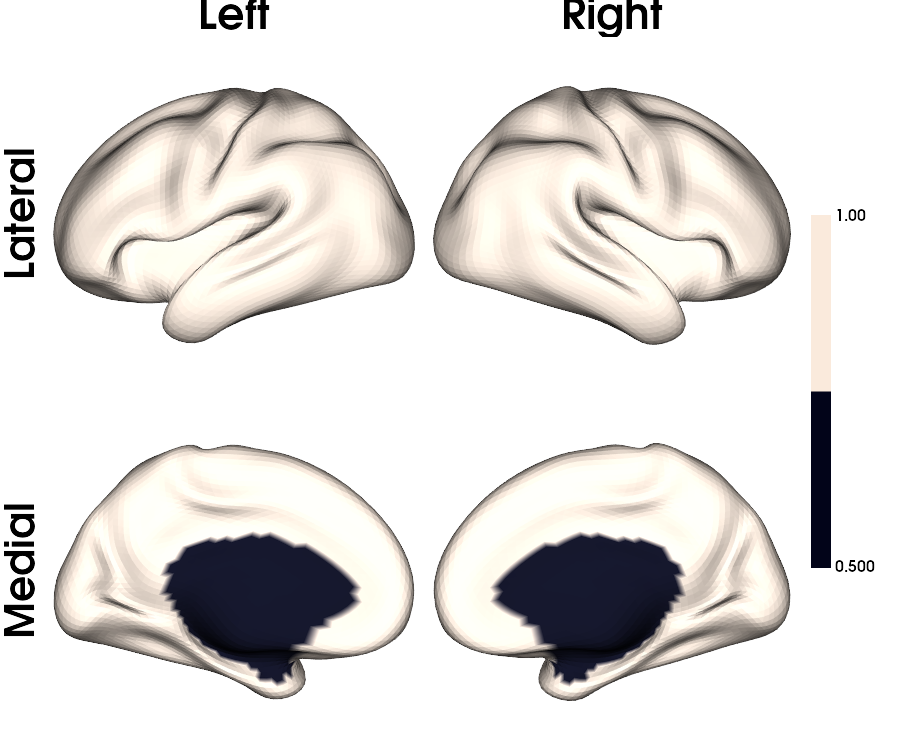

In [3]:
# Set dataset MICs as working directory
os.chdir('/data_/mica3/BIDS_MICs/derivatives/micapipe_v0.2.0')

# Load thickness to make a better mask
lh_files = sorted(glob.glob('sub-*/ses-01/maps/*_hemi-L_surf-fsLR-5k_label-thickness.func.gii'))
rh_files = sorted(glob.glob('sub-*/ses-01/maps/*_hemi-R_surf-fsLR-5k_label-thickness.func.gii'))

# Load all the thickness data
Nth=np.concatenate((nb.load(lh_files[0]).darrays[0].data, nb.load(rh_files[0]).darrays[0].data), axis=0).shape[0]

surf_map=np.empty([len(lh_files), Nth], dtype=float)
for i, _ in enumerate(lh_files):
    surf_map[i,:] = np.hstack(np.concatenate((nb.load(lh_files[i]).darrays[0].data, nb.load(rh_files[i]).darrays[0].data), axis=0))
    # Mean matrix across the x axis (vertices)
    map_mean = np.mean(surf_map, axis=0)

#mask_5k = np.where(map_mean<0.3,False, True)
plot_hemispheres(inf_lh, inf_rh, array_name=mask_5k, cmap='rocket', nan_color=(0, 0, 0, 1),
                              zoom=1.3, size=(900, 750), embed_nb=True,
                              color_bar='right', layout_style='grid', color_range=(0.5,1),
                              label_text={'left': ['Lateral', 'Medial'], 'top': ['Left', 'Right']},
                              screenshot=False)

## fsLR-5k qMRI maps

In [4]:
# load stuff
from brainspace.datasets import load_mask
mask_32k = load_mask(join=True)

inf5_lh = read_surface(micapipe + '/surfaces/fsLR-5k.L.inflated.surf.gii', itype='gii')
inf5_rh = read_surface(micapipe + '/surfaces/fsLR-5k.R.inflated.surf.gii', itype='gii')

In [5]:
def load_qmri_group(qmri=''):
    '''
    This function loads and plots the qMRI intensity maps on fsLR5k midthickness
    '''
    # List the files
    files_lh = sorted(glob.glob(f"sub-HC*/ses-*/maps/*_hemi-L_surf-fsaverage5_label-swm3.0mm_{qmri}.func.gii"))
    files_rh = sorted(glob.glob(f"sub-HC*/ses-*/maps/*_hemi-R_surf-fsaverage5_label-swm3.0mm_{qmri}.func.gii"))

    # Load all the thickness data
    Nqmri=np.concatenate((nb.load(files_lh[0]).darrays[0].data, nb.load(files_rh[0]).darrays[0].data), axis=0).shape[0]

    surf_map=np.empty([len(files_lh), Nqmri], dtype=float)
    for i, _ in enumerate(files_lh):
        surf_map[i,:] = np.hstack(np.concatenate((nb.load(files_lh[i]).darrays[0].data, nb.load(files_rh[i]).darrays[0].data), axis=0))

        # Mean matrix across the x axis (vertices)
        map_mean = np.mean(surf_map, axis=0)
    N = surf_map.shape[0]
    print(f"Numer of {qmri} maps: {N}")               
    return(map_mean,surf_map)

def plot_qmri_int(qmri='', midwall_mask=False, cmap='rocket', horiz=False, rq=(0.05, 0.95)):
    map_mean,_ = load_qmri_group(qmri)
    
    #map_mean_normalized = (map_mean - np.min(map_mean)) / (np.max(map_mean) - np.min(map_mean))
    
    # Plot the group T1map intensitites
    crange=(np.quantile(map_mean, rq[0]), np.quantile(map_mean, rq[1]))

    # Replace values in f with NaN where mask_5k is False
    if midwall_mask == True: map_mean[mask_5k == False] = np.nan
    
    if horiz == True:
        fig = plot_hemispheres(inf32_rh, inf32_lh, array_name=map_mean, size=(900, 250), color_bar='right', zoom=1.25, embed_nb=True, interactive=False, share='both',
                     nan_color=(0, 0, 0, 1), cmap=cmap, color_range=crange, transparent_bg=False, screenshot = False)

    else:
        fig = plot_hemispheres(inf32_lh, inf32_rh, array_name=map_mean, cmap=cmap, nan_color=(0, 0, 0, 1),
                  zoom=1.3, size=(900, 750), embed_nb=True, color_bar='right', layout_style='grid', color_range=crange,
                  label_text={'left': ['Lateral', 'Medial'], 'top': ['Left', 'Right']}, screenshot=False)
        
    return(fig)

In [6]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm

def plot_histogram(data, bins=100, title='Histogram', cmap='cubehelix', Range=(0, 1.5),
                   xlim=[0,1.5], ylim=400):
    non_zero_values = data[data != 0]
    n, bins, _ = plt.hist(non_zero_values, bins=bins, color='blue', alpha=0.7)
    bin_centers = (bins[:-1] + bins[1:]) / 2  # Compute the bin centers
    
    colormap = cm.get_cmap(cmap)
    colored_bins = colormap(np.interp(bin_centers, [Range[0], Range[1]], [0, 1]))
    plt.bar(bin_centers, n, width=np.diff(bin_centers[0:2]), color=colored_bins)
    
    plt.title(title)
    plt.xlabel('Intensity Value')
    plt.ylabel('Frequency')

    # Remove the outer box line
    for spine in plt.gca().spines.values():
        spine.set_visible(False)
    # Set the grid on the back
    plt.gca().set_axisbelow(True)
    plt.grid(color='gray', linestyle='dashed')

    plt.legend()
    
    # Set x-axis range (adjust as needed)
    plt.xlim(xlim)

    # Set y-axis range (adjust as needed)
    plt.ylim([0, ylim])
    
    plt.show()

## Load the data

In [246]:
def load_qmri_group_HC(qmri='', depths='1'):  
    map_means = []  # List to store map_mean values for each depth
    
    # Load CSV file containing subject and session information
    csv_dir = '/data/mica1/03_projects/youngeun/lists'
    csv_file = f"control_ye.csv"
    subject_session_info = pd.read_csv(csv_dir + '/' + csv_file, header=None, names=['info'], delimiter=',')

    # Extract subject and session information from each row
    files_lh = []
    files_rh = []
    for index, row in subject_session_info.iterrows():
        info = row['info'].split(',')
        subject = index[0:]  # Extract subject ID
        session = info[0][4:].strip()  # Extract session ID
        files_lh = sorted(glob.glob(f"sub-HC*/ses-*/maps/*_hemi-L_surf-fsaverage5_label-swm{depths}mm_{qmri}.func.gii"))
        files_rh = sorted(glob.glob(f"sub-HC*/ses-*/maps/*_hemi-R_surf-fsaverage5_label-swm{depths}mm_{qmri}.func.gii"))

    # Load all the thickness data
    Nqmri = np.concatenate((nb.load(files_lh[0]).darrays[0].data, nb.load(files_rh[0]).darrays[0].data), axis=0).shape[0]

    surf_map = np.empty([len(files_lh), Nqmri], dtype=float)
    for i, _ in enumerate(files_lh):
        surf_map[i, :] = np.hstack(np.concatenate((nb.load(files_lh[i]).darrays[0].data, nb.load(files_rh[i]).darrays[0].data), axis=0))

    # Mean matrix across the x-axis (vertices)
    map_mean = np.mean(surf_map, axis=0)
    map_means.append(map_mean)

    N = surf_map.shape[0]
    print(f"Number of {qmri} maps: {N}")
    
    # Compute the mean across the columns
    average_map_means = np.mean(map_means, axis=0)

    return average_map_means, surf_map

In [8]:
def load_qmri_group_PX(qmri='', depths='1'):  
    map_means = []  # List to store map_mean values for each depth

    # List the files
    files_lh = sorted(glob.glob(f"sub-PX*/ses-*/maps/*_hemi-L_surf-fsaverage5_label-swm{depths}mm_{qmri}.func.gii"))
    files_rh = sorted(glob.glob(f"sub-PX*/ses-*/maps/*_hemi-R_surf-fsaverage5_label-swm{depths}mm_{qmri}.func.gii"))

    # Load all the thickness data
    Nqmri = np.concatenate((nb.load(files_lh[0]).darrays[0].data, nb.load(files_rh[0]).darrays[0].data), axis=0).shape[0]

    surf_map = np.empty([len(files_lh), Nqmri], dtype=float)
    for i, _ in enumerate(files_lh):
        surf_map[i, :] = np.hstack(np.concatenate((nb.load(files_lh[i]).darrays[0].data, nb.load(files_rh[i]).darrays[0].data), axis=0))

    # Mean matrix across the x-axis (vertices)
    map_mean = np.mean(surf_map, axis=0)
    map_means.append(map_mean)

    N = surf_map.shape[0]
    print(f"Number of {qmri} maps: {N}")
    
    # Compute the mean across the columns
    average_map_means = np.mean(map_means, axis=0)

    return average_map_means, surf_map

### Flip Right TLE to the Left

In [247]:


def load_qmri_group_PX(qmri='', depths='1'):  
    map_means = []  # List to store map_mean values for each depth
    
    # Load CSV file containing subject and session information
    csv_dir = '/data/mica1/03_projects/youngeun/lists'
    csv_file = f"tle35_ye.csv"
    subject_session_info = pd.read_csv(csv_dir + '/' + csv_file, header=None, names=['info'], delimiter=',')

    # Extract subject and session information from each row
    files_lh = []
    files_rh = []
    for index, row in subject_session_info.iterrows():
        info = row['info'].split(',')
        subject = index[4:]  # Extract subject ID
        session = info[0][4:].strip()  # Extract session ID
        files_lh = sorted(glob.glob(f"sub-PX*/ses-*/maps/*_hemi-L_surf-fsaverage5_label-swm{depths}mm_{qmri}.func.gii"))
        files_rh = sorted(glob.glob(f"sub-PX*/ses-*/maps/*_hemi-R_surf-fsaverage5_label-swm{depths}mm_{qmri}.func.gii"))

    # Extract PX numbers
    px_numbers = [int(re.search(r'PX(\d+)', filename).group(1)) for filename in files_lh]

    # Load all the thickness data
    Nqmri = np.concatenate((nb.load(files_lh[0]).darrays[0].data, nb.load(files_rh[0]).darrays[0].data), axis=0).shape[0]

    surf_map = np.empty([len(files_lh), Nqmri], dtype=float)
    for i, px_number in enumerate(px_numbers):
        # Depending on the PX number, load files in a different order
        if px_number in [43, 44, 60, 61, 65, 67, 69, 79, 87, 88, 94]:
            surf_map[i, :] = np.hstack(np.concatenate((nb.load(files_rh[i]).darrays[0].data, nb.load(files_lh[i]).darrays[0].data), axis=0))
        else:
            surf_map[i, :] = np.hstack(np.concatenate((nb.load(files_lh[i]).darrays[0].data, nb.load(files_rh[i]).darrays[0].data), axis=0))

    # Mean matrix across the x-axis (vertices)
    map_mean = np.mean(surf_map, axis=0)
    map_means.append(map_mean)

    N = surf_map.shape[0]
    print(f"Number of {qmri} maps: {N}")
    
    # Compute the mean across the columns
    average_map_means = np.mean(map_means, axis=0)

    return average_map_means, surf_map

In [249]:
qmri_list = ['T1map', 'FA', 'ADC', 'flair']
depths_list = [1.0, 2.0, 3.0]
HC_map_means = {}
HC_surf_all = {}

number_of_vertices = 20484
hT1map_surf_all = np.empty((0, number_of_vertices))  
hFA_surf_all = np.empty((0, number_of_vertices))
hADC_surf_all = np.empty((0, number_of_vertices))
hflair_surf_all = np.empty((0, number_of_vertices))

for depths in depths_list:
    for qmri in qmri_list:
        HC_average_map_means, HC_surf = load_qmri_group_HC(qmri=qmri, depths=depths)
        HC_map_means.setdefault(qmri, []).append(HC_average_map_means)
        HC_surf_all.setdefault(qmri, []).append(HC_surf)

        if qmri == 'T1map':
            hT1map_surf_all = np.vstack((hT1map_surf_all, HC_surf))
        elif qmri == 'FA':
            hFA_surf_all = np.vstack((hFA_surf_all, HC_surf))
        elif qmri == 'ADC':
            hADC_surf_all = np.vstack((hADC_surf_all, HC_surf))
        elif qmri == 'flair':
            hflair_surf_all = np.vstack((hflair_surf_all, HC_surf))

Number of T1map maps: 71
Number of FA maps: 65
Number of ADC maps: 65
Number of flair maps: 71
Number of T1map maps: 71
Number of FA maps: 65
Number of ADC maps: 65
Number of flair maps: 71
Number of T1map maps: 71
Number of FA maps: 65
Number of ADC maps: 65
Number of flair maps: 71


In [250]:
qmri_list = ['T1map', 'FA', 'ADC', 'flair']
depths_list = [1.0, 2.0, 3.0]
PX_map_means = {}
PX_surf_all = {}

number_of_vertices = 20484
pT1map_surf_all = np.empty((0, number_of_vertices))  
pFA_surf_all = np.empty((0, number_of_vertices))
pADC_surf_all = np.empty((0, number_of_vertices))
pflair_surf_all = np.empty((0, number_of_vertices))

for depths in depths_list:
    for qmri in qmri_list:
        PX_average_map_means, PX_surf = load_qmri_group_PX(qmri=qmri, depths=depths)
        PX_map_means.setdefault(qmri, []).append(PX_average_map_means)
        PX_surf_all.setdefault(qmri, []).append(PX_surf)

        if qmri == 'T1map':
            pT1map_surf_all = np.vstack((pT1map_surf_all, PX_surf))
        elif qmri == 'FA':
            pFA_surf_all = np.vstack((pFA_surf_all, PX_surf))
        elif qmri == 'ADC':
            pADC_surf_all = np.vstack((pADC_surf_all, PX_surf))
        elif qmri == 'flair':
            pflair_surf_all = np.vstack((pflair_surf_all, PX_surf))

Number of T1map maps: 36
Number of FA maps: 37
Number of ADC maps: 37
Number of flair maps: 24
Number of T1map maps: 36
Number of FA maps: 37
Number of ADC maps: 37
Number of flair maps: 24
Number of T1map maps: 36
Number of FA maps: 37
Number of ADC maps: 37
Number of flair maps: 24


# T-tests examples and tutorial
https://github.com/rcruces/preproc_reports/blob/main/notebooks/MICs_fast-vs-free.ipynb 
https://brainstat.readthedocs.io/en/master/python/tutorials/tutorial_1.html#python-tutorial1

## BrainStat - Ttest

In [16]:
from brainstat.datasets import fetch_mask
from brainspace.plotting import plot_hemispheres
from brainstat.stats.terms import FixedEffect
from brainstat.stats.SLM import SLM

In [17]:
# Load fsaverage5 inflated surfaces and mask
fs5_lhi = read_surface(micapipe+'/surfaces/fsaverage5/surf/lh.inflated', itype='fs')
fs5_rhi = read_surface(micapipe+'/surfaces/fsaverage5/surf/rh.inflated', itype='fs')
fs5_mask = fetch_mask("fsaverage5")

### Voxel-wise T test

In [251]:
def feat_ttest(HC, PX, thr=0.025):
    # Concatenate all features
    ft = np.vstack((HC, PX))
    df = pd.DataFrame({'group': ['HC'] * HC.shape[0]  + ['PX'] * PX.shape[0]})

    # Create a group variable
    term_grp = FixedEffect(df['group'])

    # contrast
    contrast_grp = (df.group == 'HC').astype(int) - (df.group == 'PX').astype(int)

    # Model
    model = term_grp

    # fitting the model
    slm_model = SLM(
        model,
        contrast_grp,
        surf="fsaverage5",
        mask=fs5_mask,
        correction=["fdr", "rft"],
        cluster_threshold=thr,
        two_tailed=True,
        )
    slm_model.fit(ft)
    return(slm_model)

thr=0.025

### T1map - SWM 1mm

In [252]:
slm_model=feat_ttest(hT1map_surf_all[0:70,:], pT1map_surf_all[0:35,:])

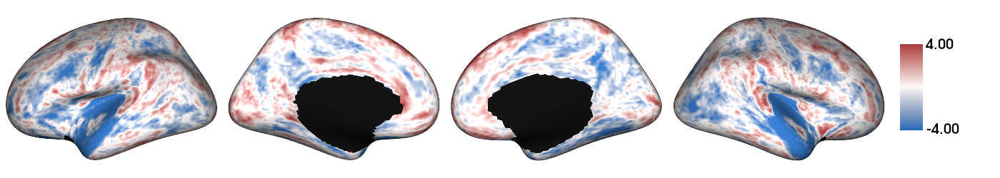

In [253]:
plot_hemispheres(fs5_lhi, fs5_rhi, slm_model.t, cmap='vlag', nan_color=(0, 0, 0, 1),
                      zoom=1.5, size=(1400, 250), embed_nb=True,
                      color_bar='right', color_range=(-4, 4),)

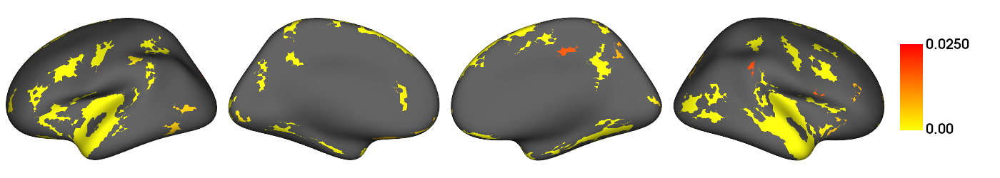

In [254]:
cp = [np.copy(slm_model.P["pval"]["C"])]
[np.place(x, np.logical_or(x > thr, ~fs5_mask), np.nan) for x in cp]

plot_hemispheres(fs5_lhi, fs5_rhi, cp[0].T, cmap='autumn_r', nan_color=(0.3, 0.3, 0.3, 1),
                      zoom=1.5, size=(1400, 250), embed_nb=True,
                      color_bar='right', color_range=(0, thr), cb__labelTextProperty={"fontSize": 20})

### T1map - SWM 2mm

In [255]:
slm_model=feat_ttest(hT1map_surf_all[71:141,:], pT1map_surf_all[36:71,:])

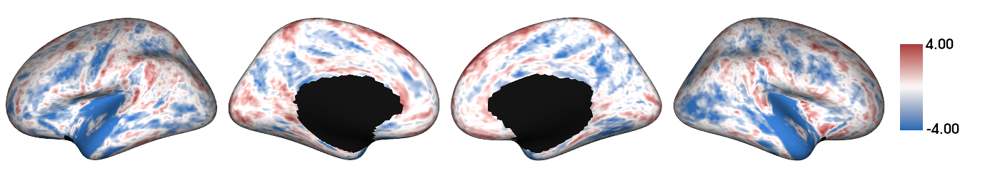

In [256]:
plot_hemispheres(fs5_lhi, fs5_rhi, slm_model.t, cmap='vlag', nan_color=(0, 0, 0, 1),
                      zoom=1.5, size=(1400, 250), embed_nb=True,
                      color_bar='right', color_range=(-4, 4),)

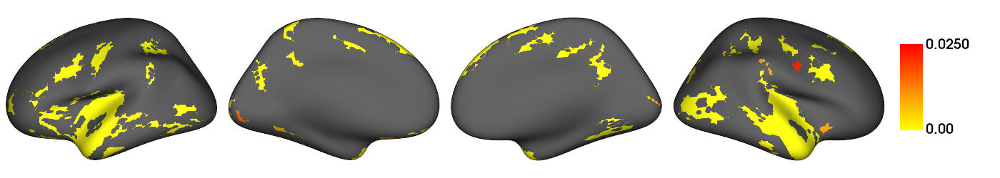

In [257]:
cp = [np.copy(slm_model.P["pval"]["C"])]
[np.place(x, np.logical_or(x > thr, ~fs5_mask), np.nan) for x in cp]

plot_hemispheres(fs5_lhi, fs5_rhi, cp[0].T, cmap='autumn_r', nan_color=(0.3, 0.3, 0.3, 1),
                      zoom=1.5, size=(1400, 250), embed_nb=True,
                      color_bar='right', color_range=(0, thr), cb__labelTextProperty={"fontSize": 20})

### T1map - SWM 3mm

In [258]:
slm_model=feat_ttest(hT1map_surf_all[142:212,:], pT1map_surf_all[72:107,:])

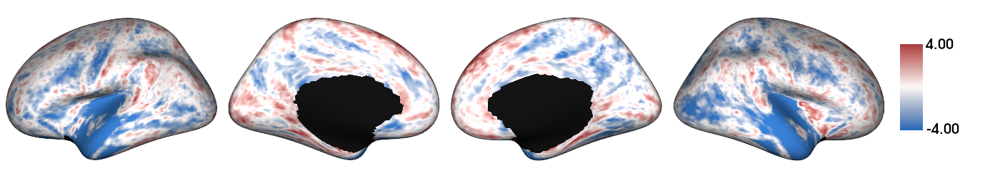

In [259]:
plot_hemispheres(fs5_lhi, fs5_rhi, slm_model.t, cmap='vlag', nan_color=(0, 0, 0, 1),
                      zoom=1.5, size=(1400, 250), embed_nb=True,
                      color_bar='right', color_range=(-4, 4),)

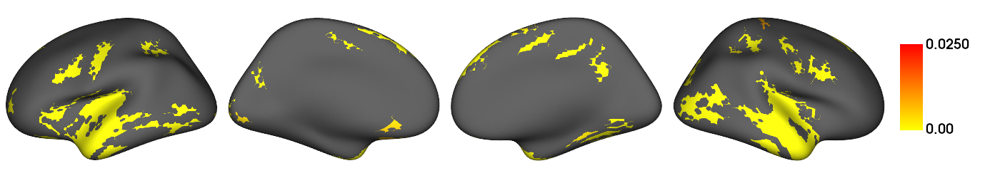

In [260]:
cp = [np.copy(slm_model.P["pval"]["C"])]
[np.place(x, np.logical_or(x > thr, ~fs5_mask), np.nan) for x in cp]

plot_hemispheres(fs5_lhi, fs5_rhi, cp[0].T, cmap='autumn_r', nan_color=(0.3, 0.3, 0.3, 1),
                      zoom=1.5, size=(1400, 250), embed_nb=True,
                      color_bar='right', color_range=(0, thr), cb__labelTextProperty={"fontSize": 20})

### FA - SWM 1mm

In [261]:
slm_model=feat_ttest(hFA_surf_all[0:64,:], pFA_surf_all[0:36,:])

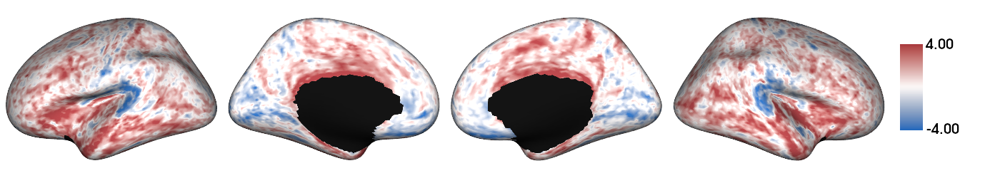

In [262]:
plot_hemispheres(fs5_lhi, fs5_rhi, slm_model.t, cmap='vlag', nan_color=(0, 0, 0, 1),
                      zoom=1.5, size=(1400, 250), embed_nb=True,
                      color_bar='right', color_range=(-4, 4),)

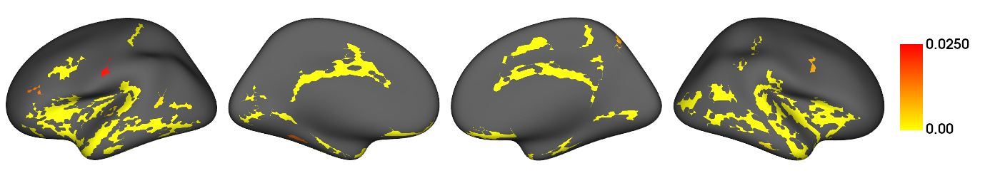

In [263]:
cp = [np.copy(slm_model.P["pval"]["C"])]
[np.place(x, np.logical_or(x > thr, ~fs5_mask), np.nan) for x in cp]

plot_hemispheres(fs5_lhi, fs5_rhi, cp[0].T, cmap='autumn_r', nan_color=(0.3, 0.3, 0.3, 1),
                      zoom=1.5, size=(1400, 250), embed_nb=True,
                      color_bar='right', color_range=(0, thr), cb__labelTextProperty={"fontSize": 20})

### FA - SWM 2mm

In [264]:
slm_model=feat_ttest(hFA_surf_all[65:129,:], pFA_surf_all[37:73,:])

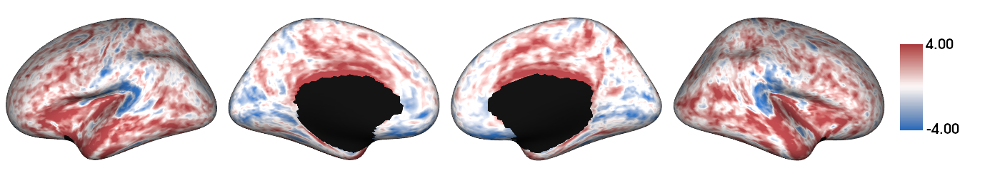

In [265]:
plot_hemispheres(fs5_lhi, fs5_rhi, slm_model.t, cmap='vlag', nan_color=(0, 0, 0, 1),
                      zoom=1.5, size=(1400, 250), embed_nb=True,
                      color_bar='right', color_range=(-4, 4),)

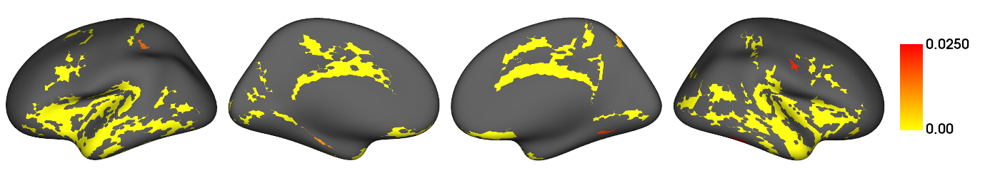

In [266]:
cp = [np.copy(slm_model.P["pval"]["C"])]
[np.place(x, np.logical_or(x > thr, ~fs5_mask), np.nan) for x in cp]

plot_hemispheres(fs5_lhi, fs5_rhi, cp[0].T, cmap='autumn_r', nan_color=(0.3, 0.3, 0.3, 1),
                      zoom=1.5, size=(1400, 250), embed_nb=True,
                      color_bar='right', color_range=(0, thr), cb__labelTextProperty={"fontSize": 20})

### FA - SWM 3mm

In [267]:
slm_model=feat_ttest(hFA_surf_all[130:194,:], pFA_surf_all[74:110,:])

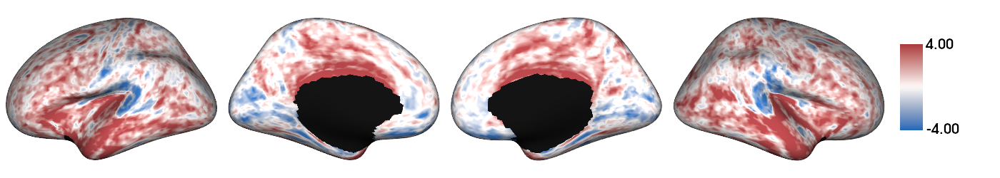

In [268]:
plot_hemispheres(fs5_lhi, fs5_rhi, slm_model.t, cmap='vlag', nan_color=(0, 0, 0, 1),
                      zoom=1.5, size=(1400, 250), embed_nb=True,
                      color_bar='right', color_range=(-4, 4),)

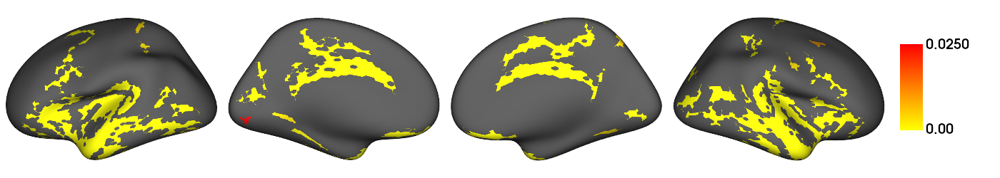

In [269]:
cp = [np.copy(slm_model.P["pval"]["C"])]
[np.place(x, np.logical_or(x > thr, ~fs5_mask), np.nan) for x in cp]

plot_hemispheres(fs5_lhi, fs5_rhi, cp[0].T, cmap='autumn_r', nan_color=(0.3, 0.3, 0.3, 1),
                      zoom=1.5, size=(1400, 250), embed_nb=True,
                      color_bar='right', color_range=(0, thr), cb__labelTextProperty={"fontSize": 20})

### ADC - SWM 1mm

In [270]:
slm_model=feat_ttest(hADC_surf_all[1:64,:], pADC_surf_all[1:36,:])

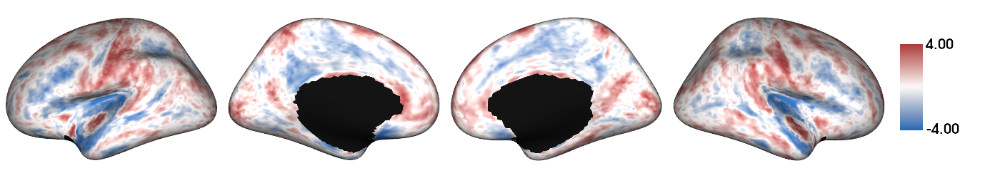

In [271]:
plot_hemispheres(fs5_lhi, fs5_rhi, slm_model.t, cmap='vlag', nan_color=(0, 0, 0, 1),
                      zoom=1.5, size=(1400, 250), embed_nb=True,
                      color_bar='right', color_range=(-4, 4),)

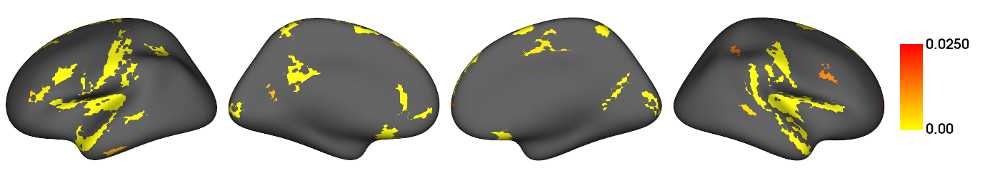

In [272]:
cp = [np.copy(slm_model.P["pval"]["C"])]
[np.place(x, np.logical_or(x > thr, ~fs5_mask), np.nan) for x in cp]

plot_hemispheres(fs5_lhi, fs5_rhi, cp[0].T, cmap='autumn_r', nan_color=(0.3, 0.3, 0.3, 1),
                      zoom=1.5, size=(1400, 250), embed_nb=True,
                      color_bar='right', color_range=(0, thr), cb__labelTextProperty={"fontSize": 20})

### ADC - SWM 2mm

In [273]:
slm_model=feat_ttest(hADC_surf_all[65:129,:], pADC_surf_all[37:73,:])

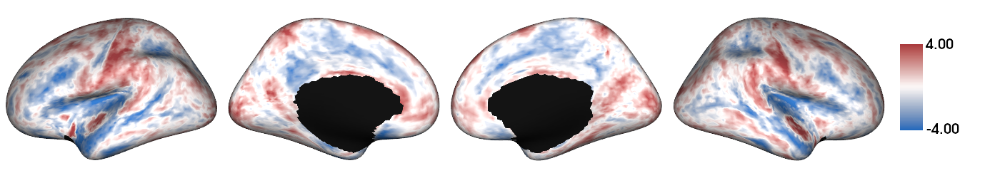

In [274]:
plot_hemispheres(fs5_lhi, fs5_rhi, slm_model.t, cmap='vlag', nan_color=(0, 0, 0, 1),
                      zoom=1.5, size=(1400, 250), embed_nb=True,
                      color_bar='right', color_range=(-4, 4),)

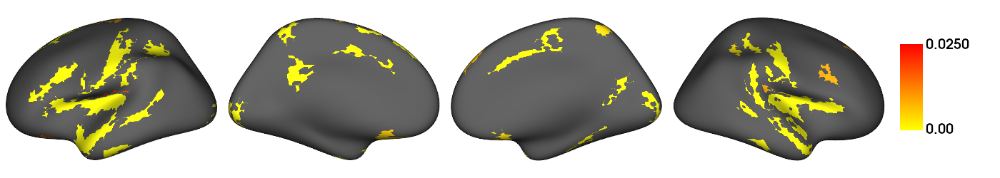

In [275]:
cp = [np.copy(slm_model.P["pval"]["C"])]
[np.place(x, np.logical_or(x > thr, ~fs5_mask), np.nan) for x in cp]

plot_hemispheres(fs5_lhi, fs5_rhi, cp[0].T, cmap='autumn_r', nan_color=(0.3, 0.3, 0.3, 1),
                      zoom=1.5, size=(1400, 250), embed_nb=True,
                      color_bar='right', color_range=(0, thr), cb__labelTextProperty={"fontSize": 20})

### ADC - SWM 3mm

In [276]:
slm_model=feat_ttest(hADC_surf_all[130:194,:], pADC_surf_all[74:110,:])

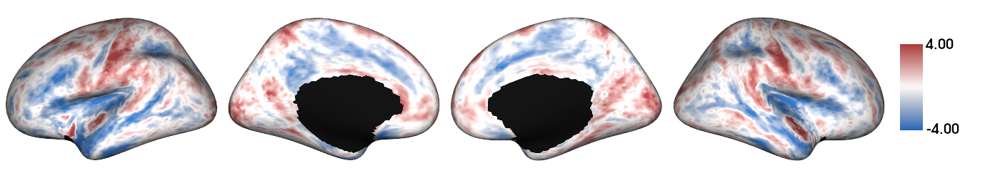

In [277]:
plot_hemispheres(fs5_lhi, fs5_rhi, slm_model.t, cmap='vlag', nan_color=(0, 0, 0, 1),
                      zoom=1.5, size=(1400, 250), embed_nb=True,
                      color_bar='right', color_range=(-4, 4),)

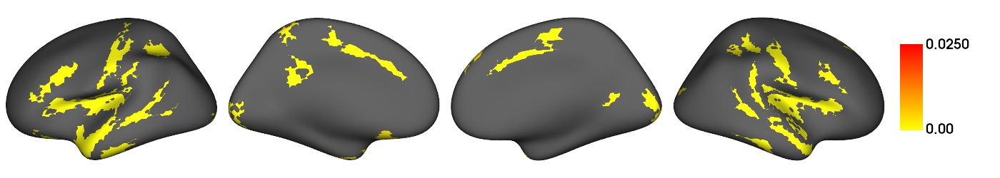

In [278]:
cp = [np.copy(slm_model.P["pval"]["C"])]
[np.place(x, np.logical_or(x > thr, ~fs5_mask), np.nan) for x in cp]

plot_hemispheres(fs5_lhi, fs5_rhi, cp[0].T, cmap='autumn_r', nan_color=(0.3, 0.3, 0.3, 1),
                      zoom=1.5, size=(1400, 250), embed_nb=True,
                      color_bar='right', color_range=(0, thr), cb__labelTextProperty={"fontSize": 20})

### Flair - SWM 1mm

In [279]:
slm_model=feat_ttest(hflair_surf_all[0:70,:], pflair_surf_all[0:23,:])

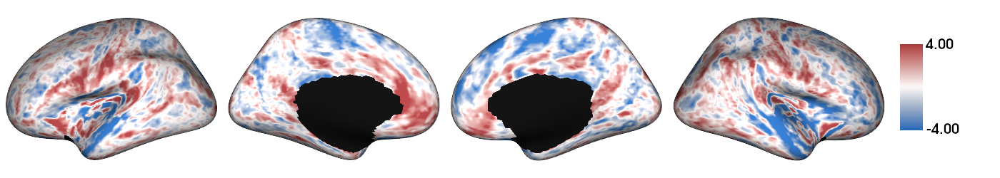

In [280]:
plot_hemispheres(fs5_lhi, fs5_rhi, slm_model.t, cmap='vlag', nan_color=(0, 0, 0, 1),
                      zoom=1.5, size=(1400, 250), embed_nb=True,
                      color_bar='right', color_range=(-4, 4),)

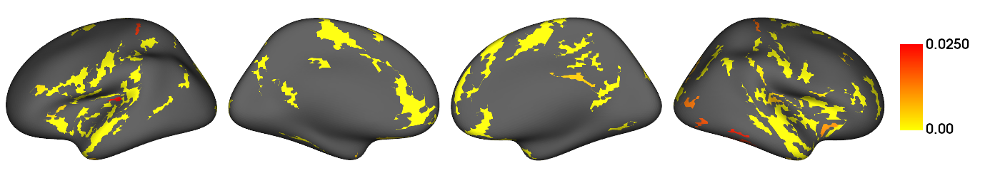

In [281]:
cp = [np.copy(slm_model.P["pval"]["C"])]
[np.place(x, np.logical_or(x > thr, ~fs5_mask), np.nan) for x in cp]

plot_hemispheres(fs5_lhi, fs5_rhi, cp[0].T, cmap='autumn_r', nan_color=(0.3, 0.3, 0.3, 1),
                      zoom=1.5, size=(1400, 250), embed_nb=True,
                      color_bar='right', color_range=(0, thr), cb__labelTextProperty={"fontSize": 20})

### Flair - SWM 2mm

In [282]:
slm_model=feat_ttest(hflair_surf_all[71:141,:], pflair_surf_all[24:46,:])

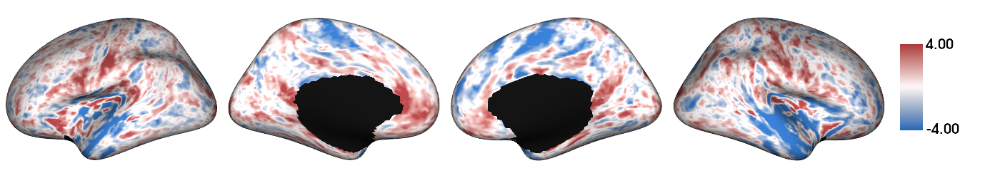

In [283]:
plot_hemispheres(fs5_lhi, fs5_rhi, slm_model.t, cmap='vlag', nan_color=(0, 0, 0, 1),
                      zoom=1.5, size=(1400, 250), embed_nb=True,
                      color_bar='right', color_range=(-4, 4),)

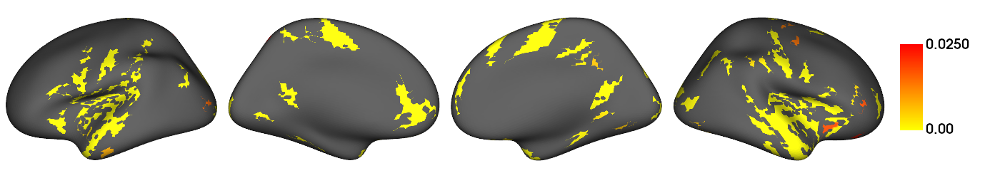

In [284]:
cp = [np.copy(slm_model.P["pval"]["C"])]
[np.place(x, np.logical_or(x > thr, ~fs5_mask), np.nan) for x in cp]

plot_hemispheres(fs5_lhi, fs5_rhi, cp[0].T, cmap='autumn_r', nan_color=(0.3, 0.3, 0.3, 1),
                      zoom=1.5, size=(1400, 250), embed_nb=True,
                      color_bar='right', color_range=(0, thr), cb__labelTextProperty={"fontSize": 20})

### Flair - SWM 3mm

In [285]:
slm_model=feat_ttest(hflair_surf_all[142:212,:], pflair_surf_all[48:71,:])

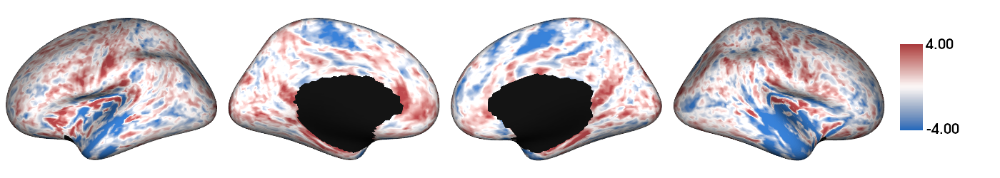

In [286]:
plot_hemispheres(fs5_lhi, fs5_rhi, slm_model.t, cmap='vlag', nan_color=(0, 0, 0, 1),
                      zoom=1.5, size=(1400, 250), embed_nb=True,
                      color_bar='right', color_range=(-4, 4),)

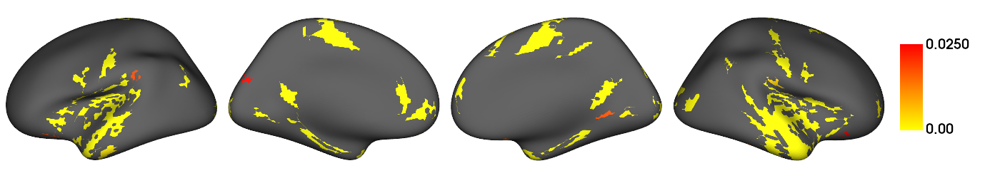

In [287]:
cp = [np.copy(slm_model.P["pval"]["C"])]
[np.place(x, np.logical_or(x > thr, ~fs5_mask), np.nan) for x in cp]

plot_hemispheres(fs5_lhi, fs5_rhi, cp[0].T, cmap='autumn_r', nan_color=(0.3, 0.3, 0.3, 1),
                      zoom=1.5, size=(1400, 250), embed_nb=True,
                      color_bar='right', color_range=(0, thr), cb__labelTextProperty={"fontSize": 20})

### Depth-wise T test

In [203]:
import numpy as np
from scipy.stats import ttest_ind

for i, (hc_mm, tle_mm) in enumerate([(HCC_1mm, TLEC_1mm), (HCC_2mm, TLEC_2mm), (HCC_3mm, TLEC_3mm)]):
    print(f"Results for mm {i+1}:")
    for j in range(hc_mm.shape[0]): 
        t_statistic, p_value = ttest_ind(hc_mm[j], tle_mm[j])
        print(f"T-test result for row {j+1}: t-statistic={t_statistic}, p-value={p_value}")

Results for mm 1:
T-test result for row 1: t-statistic=-1.9101662353150588, p-value=0.056126101737488505
T-test result for row 2: t-statistic=0.087711657842881, p-value=0.9301067319441194
T-test result for row 3: t-statistic=1.677034010940546, p-value=0.09355146001808083
T-test result for row 4: t-statistic=-0.9571102526411436, p-value=0.33852317940906707
Results for mm 2:
T-test result for row 1: t-statistic=0.26707309845624577, p-value=0.7894156337700665
T-test result for row 2: t-statistic=-0.7220994180932604, p-value=0.4702417992265452
T-test result for row 3: t-statistic=-2.215297345650771, p-value=0.026750884626867564
T-test result for row 4: t-statistic=-0.10656910358799807, p-value=0.9151318996850442
Results for mm 3:
T-test result for row 1: t-statistic=1.3963030052957608, p-value=0.1626387672252666
T-test result for row 2: t-statistic=0.0981735734671824, p-value=0.9217954503108834
T-test result for row 3: t-statistic=-0.7815001196844746, p-value=0.4345176580858079
T-test resu

## Comparesion with midthickness

### Load the data

In [211]:
def load_qmri_group_HC_midthickness(qmri='', depths='1'):  
    map_means = []  # List to store map_mean values for each depth

    # List the files
    files_lh = sorted(glob.glob(f"sub-HC*/ses-*/maps/*_hemi-L_surf-fsaverage5_label-midthickness_{qmri}.func.gii"))
    files_rh = sorted(glob.glob(f"sub-HC*/ses-*/maps/*_hemi-R_surf-fsaverage5_label-midthickness_{qmri}.func.gii"))

    # Load all the thickness data
    Nqmri = np.concatenate((nb.load(files_lh[0]).darrays[0].data, nb.load(files_rh[0]).darrays[0].data), axis=0).shape[0]

    surf_map = np.empty([len(files_lh), Nqmri], dtype=float)
    for i, _ in enumerate(files_lh):
        surf_map[i, :] = np.hstack(np.concatenate((nb.load(files_lh[i]).darrays[0].data, nb.load(files_rh[i]).darrays[0].data), axis=0))

    # Mean matrix across the x-axis (vertices)
    map_mean = np.mean(surf_map, axis=0)
    map_means.append(map_mean)

    N = surf_map.shape[0]
    print(f"Number of {qmri} maps: {N}")
    
    # Compute the mean across the columns
    average_map_means = np.mean(map_means, axis=0)

    return average_map_means, surf_map

import re

def load_qmri_group_PX_midthickness(qmri=''):  
    map_means = []  # List to store map_mean values for each depth

    # List of specific PX numbers to consider
    specific_pxs = ['PX003', 'PX005', 'PX012', 'PX013', 'PX016', 'PX019', 'PX020', 'PX021', 'PX024', 'PX025', 'PX026', 'PX028', 'PX032', 'PX06', 'PX042', 'PX043', 'PX044', 'PX047', 'PX053', 'PX055', 'PX060', 'PX061', 'PX062', 'PX063', 'PX065', 'PX067', 'PX068', 'PX069', 'PX070', 'PX072', 'PX075', 'PX079', 'PX087', 'PX088', 'PX094']
    
    files_lh = []
    files_rh = []
    for px in specific_pxs:
        files_lh.extend(sorted(glob.glob(f"sub-{px}/ses-*/maps/*_hemi-L_surf-fsaverage5_label-midthickness_{qmri}.func.gii")))
        files_rh.extend(sorted(glob.glob(f"sub-{px}/ses-*/maps/*_hemi-R_surf-fsaverage5_label-midthickness_{qmri}.func.gii")))

    # Extract PX numbers
    px_numbers = [int(re.search(r'PX(\d+)', filename).group(1)) for filename in files_lh]

    # Load all the thickness data
    Nqmri = np.concatenate((nb.load(files_lh[0]).darrays[0].data, nb.load(files_rh[0]).darrays[0].data), axis=0).shape[0]

    surf_map = np.empty([len(files_lh), Nqmri], dtype=float)
    for i, px_number in enumerate(px_numbers):
        # Depending on the PX number, load files in a different order
        if px_number in [43, 44, 60, 61, 65, 67, 69, 79, 87, 88, 94]:
            surf_map[i, :] = np.hstack(np.concatenate((nb.load(files_rh[i]).darrays[0].data, nb.load(files_lh[i]).darrays[0].data), axis=0))
        else:
            surf_map[i, :] = np.hstack(np.concatenate((nb.load(files_lh[i]).darrays[0].data, nb.load(files_rh[i]).darrays[0].data), axis=0))

    # Mean matrix across the x-axis (vertices)
    map_mean = np.mean(surf_map, axis=0)
    map_means.append(map_mean)

    N = surf_map.shape[0]
    print(f"Number of {qmri} maps: {N}")
    
    # Compute the mean across the columns
    average_map_means = np.mean(map_means, axis=0)

    return average_map_means, surf_map

In [229]:
def load_qmri_group_HC_midthickness(qmri=''):  
    map_means = []  # List to store map_mean values for each depth

    # Load CSV file containing subject and session information
    csv_dir = '/data/mica1/03_projects/youngeun/lists'
    csv_file = f"control_ye.csv"
    subject_session_info = pd.read_csv(csv_dir + '/' + csv_file, header=None, names=['info'], delimiter=',')

    # Extract subject and session information from each row
    files_lh = []
    files_rh = []
    for index, row in subject_session_info.iterrows():
        info = row['info'].split(',')
        subject = index[0:]  # Extract subject ID
        session = info[0][4:].strip()  # Extract session ID
        files_lh.extend(sorted(glob.glob(f"sub-{subject}/ses-{session}/maps/*_hemi-L_surf-fsaverage5_label-midthickness_{qmri}.func.gii")))
        files_rh.extend(sorted(glob.glob(f"sub-{subject}/ses-{session}/maps/*_hemi-R_surf-fsaverage5_label-midthickness_{qmri}.func.gii")))

    # Load all the thickness data
    Nqmri = np.concatenate((nb.load(files_lh[0]).darrays[0].data, nb.load(files_rh[0]).darrays[0].data), axis=0).shape[0]

    surf_map = np.empty([len(files_lh), Nqmri], dtype=float)
    for i, _ in enumerate(files_lh):
        surf_map[i, :] = np.hstack(np.concatenate((nb.load(files_lh[i]).darrays[0].data, nb.load(files_rh[i]).darrays[0].data), axis=0))

    # Mean matrix across the x-axis (vertices)
    map_mean = np.mean(surf_map, axis=0)
    map_means.append(map_mean)

    N = surf_map.shape[0]
    print(f"Number of {qmri} maps: {N}")
    
    # Compute the mean across the columns
    average_map_means = np.mean(map_means, axis=0)

    return average_map_means, surf_map

def load_qmri_group_PX_midthickness(qmri=''):  
    map_means = []  # List to store map_mean values for each depth

    # Load CSV file containing subject and session information
    csv_dir = '/data/mica1/03_projects/youngeun/lists'
    csv_file = f"tle35_ye.csv"
    subject_session_info = pd.read_csv(csv_dir + '/' + csv_file, header=None, names=['info'], delimiter=',')

    # Extract subject and session information from each row
    files_lh = []
    files_rh = []
    for index, row in subject_session_info.iterrows():
        info = row['info'].split(',')
        subject = index[4:]  # Extract subject ID
        session = info[0][4:].strip()  # Extract session ID
        files_lh.extend(sorted(glob.glob(f"sub-{subject}/ses-{session}/maps/*_hemi-L_surf-fsaverage5_label-midthickness_{qmri}.func.gii")))
        files_rh.extend(sorted(glob.glob(f"sub-{subject}/ses-{session}/maps/*_hemi-R_surf-fsaverage5_label-midthickness_{qmri}.func.gii")))

    # Extract PX numbers
    px_numbers = [int(re.search(r'PX(\d+)', filename).group(1)) for filename in files_lh]

    # Load all the thickness data
    Nqmri = np.concatenate((nb.load(files_lh[0]).darrays[0].data, nb.load(files_rh[0]).darrays[0].data), axis=0).shape[0]

    surf_map = np.empty([len(files_lh), Nqmri], dtype=float)
    for i, px_number in enumerate(px_numbers):
        # Depending on the PX number, load files in a different order
        if px_number in [43, 44, 60, 61, 65, 67, 69, 79, 87, 88, 94]:
            surf_map[i, :] = np.hstack(np.concatenate((nb.load(files_rh[i]).darrays[0].data, nb.load(files_lh[i]).darrays[0].data), axis=0))
        else:
            surf_map[i, :] = np.hstack(np.concatenate((nb.load(files_lh[i]).darrays[0].data, nb.load(files_rh[i]).darrays[0].data), axis=0))

    # Mean matrix across the x-axis (vertices)
    map_mean = np.mean(surf_map, axis=0)
    map_means.append(map_mean)

    N = surf_map.shape[0]
    print(f"Number of {qmri} maps: {N}")
    
    # Compute the mean across the columns
    average_map_means = np.mean(map_means, axis=0)

    return average_map_means, surf_map

In [230]:
qmri_list = ['T1map', 'FA', 'ADC', 'flair']
HC_map_means = {}
HC_surf_all = {}

number_of_vertices = 20484
hT1map_surf_all = np.empty((0, number_of_vertices))  
hFA_surf_all = np.empty((0, number_of_vertices))
hADC_surf_all = np.empty((0, number_of_vertices))
hflair_surf_all = np.empty((0, number_of_vertices))

for qmri in qmri_list:
    HC_average_map_means, HC_surf = load_qmri_group_HC_midthickness(qmri=qmri)
    HC_map_means.setdefault(qmri, []).append(HC_average_map_means)
    HC_surf_all.setdefault(qmri, []).append(HC_surf)

    if qmri == 'T1map':
        hT1map_surf_all = np.vstack((hT1map_surf_all, HC_surf))
    elif qmri == 'FA':
        hFA_surf_all = np.vstack((hFA_surf_all, HC_surf))
    elif qmri == 'ADC':
        hADC_surf_all = np.vstack((hADC_surf_all, HC_surf))
    elif qmri == 'flair':
        hflair_surf_all = np.vstack((hflair_surf_all, HC_surf))

Number of T1map maps: 70
Number of FA maps: 72
Number of ADC maps: 72
Number of flair maps: 71


In [226]:
qmri_list = ['T1map', 'FA', 'ADC', 'flair']
PX_map_means = {}
PX_surf_all = {}

number_of_vertices = 20484
pT1map_surf_all = np.empty((0, number_of_vertices))  
pFA_surf_all = np.empty((0, number_of_vertices))
pADC_surf_all = np.empty((0, number_of_vertices))
pflair_surf_all = np.empty((0, number_of_vertices))

for qmri in qmri_list:
    PX_average_map_means, PX_surf = load_qmri_group_PX_midthickness(qmri=qmri)
    PX_map_means.setdefault(qmri, []).append(PX_average_map_means)
    PX_surf_all.setdefault(qmri, []).append(PX_surf)

    if qmri == 'T1map':
        pT1map_surf_all = np.vstack((pT1map_surf_all, PX_surf))
    elif qmri == 'FA':
        pFA_surf_all = np.vstack((pFA_surf_all, PX_surf))
    elif qmri == 'ADC':
        pADC_surf_all = np.vstack((pADC_surf_all, PX_surf))
    elif qmri == 'flair':
        pflair_surf_all = np.vstack((pflair_surf_all, PX_surf))

Number of T1map maps: 34
Number of FA maps: 35
Number of ADC maps: 35
Number of flair maps: 22


### T1map - midthickness

In [231]:
slm_model=feat_ttest(hT1map_surf_all, pT1map_surf_all)

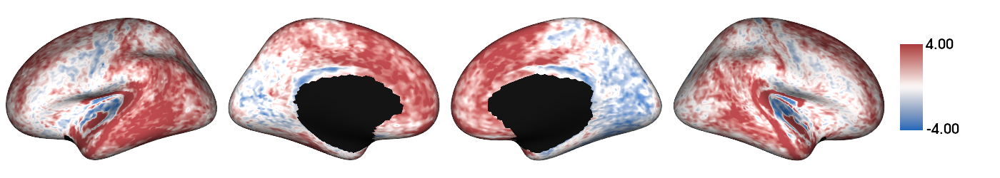

In [232]:
plot_hemispheres(fs5_lhi, fs5_rhi, slm_model.t, cmap='vlag', nan_color=(0, 0, 0, 1),
                      zoom=1.5, size=(1400, 250), embed_nb=True,
                      color_bar='right', color_range=(-4, 4),)

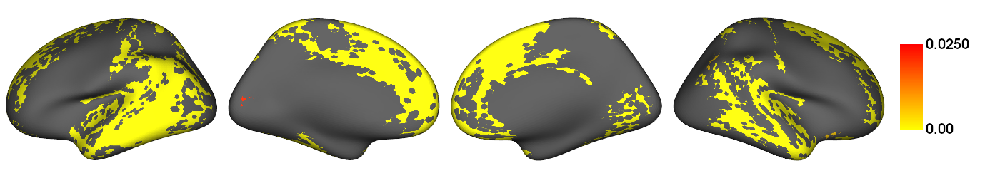

In [233]:
cp = [np.copy(slm_model.P["pval"]["C"])]
[np.place(x, np.logical_or(x > thr, ~fs5_mask), np.nan) for x in cp]

plot_hemispheres(fs5_lhi, fs5_rhi, cp[0].T, cmap='autumn_r', nan_color=(0.3, 0.3, 0.3, 1),
                      zoom=1.5, size=(1400, 250), embed_nb=True,
                      color_bar='right', color_range=(0, thr), cb__labelTextProperty={"fontSize": 20})

### FA - midthickness

In [234]:
slm_model=feat_ttest(hFA_surf_all, pFA_surf_all)

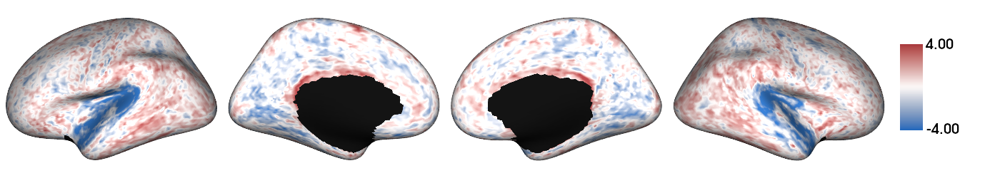

In [235]:
plot_hemispheres(fs5_lhi, fs5_rhi, slm_model.t, cmap='vlag', nan_color=(0, 0, 0, 1),
                      zoom=1.5, size=(1400, 250), embed_nb=True,
                      color_bar='right', color_range=(-4, 4),)

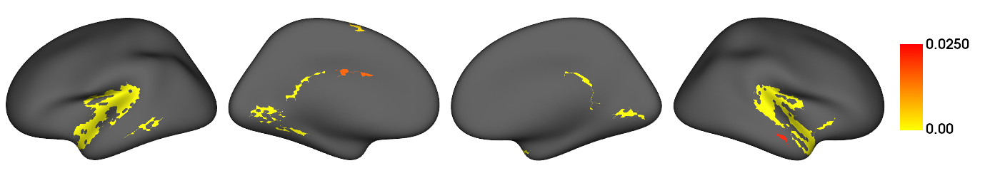

In [236]:
cp = [np.copy(slm_model.P["pval"]["C"])]
[np.place(x, np.logical_or(x > thr, ~fs5_mask), np.nan) for x in cp]

plot_hemispheres(fs5_lhi, fs5_rhi, cp[0].T, cmap='autumn_r', nan_color=(0.3, 0.3, 0.3, 1),
                      zoom=1.5, size=(1400, 250), embed_nb=True,
                      color_bar='right', color_range=(0, thr), cb__labelTextProperty={"fontSize": 20})

### ADC - midthickness

In [237]:
slm_model=feat_ttest(hADC_surf_all, pADC_surf_all)

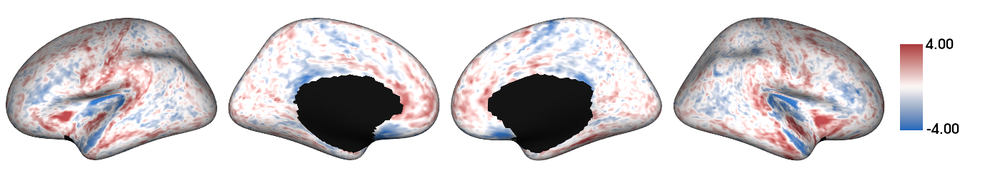

In [238]:
plot_hemispheres(fs5_lhi, fs5_rhi, slm_model.t, cmap='vlag', nan_color=(0, 0, 0, 1),
                      zoom=1.5, size=(1400, 250), embed_nb=True,
                      color_bar='right', color_range=(-4, 4),)

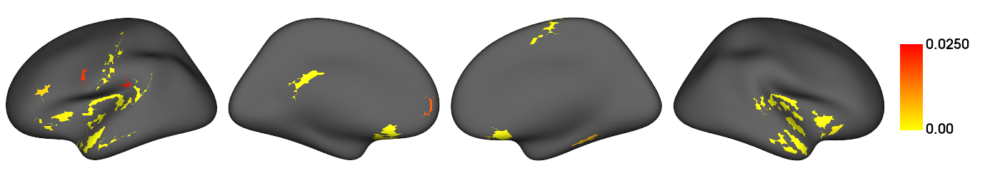

In [239]:
cp = [np.copy(slm_model.P["pval"]["C"])]
[np.place(x, np.logical_or(x > thr, ~fs5_mask), np.nan) for x in cp]

plot_hemispheres(fs5_lhi, fs5_rhi, cp[0].T, cmap='autumn_r', nan_color=(0.3, 0.3, 0.3, 1),
                      zoom=1.5, size=(1400, 250), embed_nb=True,
                      color_bar='right', color_range=(0, thr), cb__labelTextProperty={"fontSize": 20})

### Flair - midthickness

In [240]:
slm_model=feat_ttest(hflair_surf_all, pflair_surf_all)

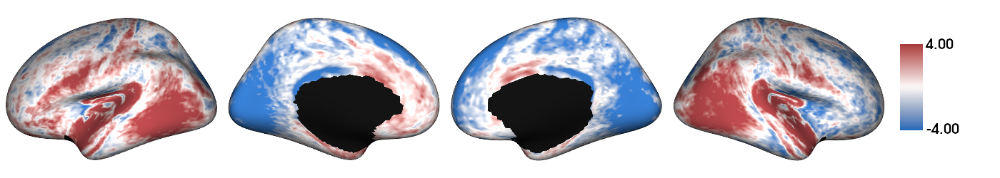

In [241]:
plot_hemispheres(fs5_lhi, fs5_rhi, slm_model.t, cmap='vlag', nan_color=(0, 0, 0, 1),
                      zoom=1.5, size=(1400, 250), embed_nb=True,
                      color_bar='right', color_range=(-4, 4),)

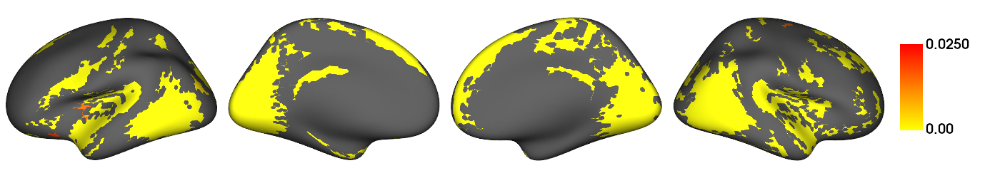

In [242]:
cp = [np.copy(slm_model.P["pval"]["C"])]
[np.place(x, np.logical_or(x > thr, ~fs5_mask), np.nan) for x in cp]

plot_hemispheres(fs5_lhi, fs5_rhi, cp[0].T, cmap='autumn_r', nan_color=(0.3, 0.3, 0.3, 1),
                      zoom=1.5, size=(1400, 250), embed_nb=True,
                      color_bar='right', color_range=(0, thr), cb__labelTextProperty={"fontSize": 20})